# **EDA PISI3 - Grupo 02**
Nessa análise exploratória de dados, iremos explorar os dados brutos obitidos no dataset escolhido - Diabetes Health Indicators Dataset. Aqui, iremos entender e observar melhor os dados que possuímos, como manipular, modelar e entender o comportamento desses dados.

Link do dataset: https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset?resource=download&select=diabetes_012_health_indicators_BRFSS2015.csv



# Imports
Para essa análise, utilizaremos a biblioteca pandas


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as clu
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
import plotly.express as px


# Leitura e Escrita de Datasets

Nessa etapa, iremos receber os datasets e transforma-los em dataframes.


In [2]:

df_Diabetes = pd.read_csv('../DiabetesDataSet/diabetes_012_health_indicators_BRFSS2015.csv',low_memory=False)
pd.set_option('display.max_columns', 200)

# Observando o DataSet


In [3]:
#Nessa linha, podemos observar os 5 primeiros e 5 últimos registros
#Além disso, podemos verificar o número de linhas e colunas
display(df_Diabetes)

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,2.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0


Verificando valores nulos e tipos de dados 

In [4]:
df_Diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_012          253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

Diante disso, é possível verificar que todos os tipos de dados presentes no Dataset são do tipo float e são não nulos.

Outra verificação importante no tratamento dos dados é a quantidade de dados duplicados

In [5]:
print(df_Diabetes.duplicated().sum())

23899


Agora, vamos verificar informações estatísticas do Dataset


In [6]:
df_Diabetes.describe()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.296921,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,0.811420,0.056197,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.698160,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,0.391175,0.230302,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


De acordo com a legenda fornecida no kaggle, o número 2 representa a diabetes na coluna Diabetes_012. Vamos verificar quantos registros de diabéticos temos. 

In [7]:
diabeticos = (df_Diabetes['Diabetes_012'] == 2).sum()
print("Casos de diabéticos = "+ str(diabeticos))


Casos de diabéticos = 35346


Diante desse caso, mostra necessidade de entender melhor sobre as colunas e realizar analises sobre elas


Vamos verificar a análise da coluna relacionada a Diabetes:

In [18]:
import plotly.express as px

# Definindo as cores padrão: vermelho para 'Sem Diabetes', cinza para 'Pré-diabetes', azul para 'Diabetes'
colors = {'Sem Diabetes': 'red', 
          'Pré-diabetes': 'gray', 
          'Diabetes': 'blue'}

# Crie o gráfico com o título e labels corrigidos
fig = px.histogram(df_Diabetes, 
                   x='Diabetes_012', 
                   title='Distribuição dos dados de diabetes',
                   category_orders={'Diabetes_012': ['0', '1', '2']})

# Atualize os labels no eixo x
fig.update_layout(xaxis=dict(
    tickvals=[0, 1, 2],
    ticktext=['Sem Diabetes', 'Pré-diabetes', 'Diabetes'],
    title='Condição de diabetes'  # Adiciona o título personalizado para o eixo X
))

# Aplicando as cores personalizadas para cada categoria
fig.update_traces(marker=dict(color=[colors['Sem Diabetes'], 
                                     colors['Pré-diabetes'], 
                                     colors['Diabetes']]))

fig.show()


Ao analisar a coluna, percebe-se que se trata de uma distribuição assimétrica, onde a maioria dos dados indicam pessoas não diabéticas, seguido de pessoas diabéticas e, por último, pouquíssimos casos de pessoas pré-diabeticas.

Vamos verificar a análise da Coluna IMC (BMI):

In [14]:
fig = px.histogram(df_Diabetes, x='BMI', title='Distribuição da Coluna de BMI (IMC)')
fig.show()

In [15]:
fig = px.box(df_Diabetes, x='BMI', title='Bloxpot da Coluna BMI (IMC)')
fig.show()

Na coluna referente aos IMC's, percebe-se que se trata de uma distribuição assimétrica positiva, com a maioria dos valores concentrados entre 20 e 30, mas com uma cauda longa que se estende a valores mais altos. A presença de muitos outliers sugere que há indivíduos com IMC significativamente mais altos, o que pode ser relevante para análises subsequentes.

Vamos verificar a análise da Coluna referente a atividades físicas (PhysActivity):

In [25]:
import plotly.express as px

# Definindo as cores padrão: vermelho para 'Não' e azul para 'Sim'
colors = {'Faz atividade física': 'blue', 
          'Não faz atividade física': 'red'}

# Criando o gráfico de barras horizontal com o título e rótulos corrigidos
fig = px.bar(x=df_Diabetes['PhysActivity'].value_counts().values,  # Quantidades corretas
             y=['Faz atividade física', 'Não faz atividade física'],  # Rótulos corretos
             orientation='h',  # Gráfico de barras horizontal
             title='Distribuição de Atividades Físicas nos Últimos 30 Dias',
             text_auto=True,  # Adiciona os valores diretamente nas barras
             color=['Faz atividade física', 'Não faz atividade física'],  # Aplicação das cores padronizadas
             color_discrete_map=colors)  # Aplicando o mapeamento de cores padrão

# Ajuste do layout para centralizar o título e espaçar as barras
fig.update_layout(title_x=0.5, bargap=0.2)

# Exibir o gráfico
fig.show()


Na coluna de atividades físicas percebe-se que a maioria dos indivíduos realiza atividades físicas. A variável é binária, com dois valores distintos: 0 (não realiza atividades físicas) e 1 (realiza atividades físicas).

Vamos verificar a análise da coluna referente a cobertura de saúde (AnyHealthcare):

In [22]:
import plotly.express as px

# Definindo as cores padrão: vermelho para 'Não' e azul para 'Sim'
colors = {'Tem cobertura de saúde': 'blue', 
          'Não tem cobertura de saúde': 'red'}

# Criando o gráfico de barras com o título e rótulos corrigidos
fig = px.bar(x=df_Diabetes['AnyHealthcare'].value_counts().values,  # Quantidades corretas
             y=['Tem cobertura de saúde','Não tem cobertura de saúde'],  # Rótulos personalizados
             orientation='h',  # Gráfico de barras horizontal
             title='Distribuição da Coluna de Cobertura de Saúde',
             text_auto=True,  # Adiciona os valores diretamente nas barras
             color=['Tem cobertura de saúde', 'Não tem cobertura de saúde'],  # Aplicação das cores padronizadas
             color_discrete_map=colors)  # Aplicando o mapeamento de cores padrão

# Ajuste do layout para centralizar o título e espaçar as barras
fig.update_layout(title_x=0.5, bargap=0.2)

# Exibir o gráfico
fig.show()


A coluna referente a cobertura de saúde tembém possui variável binária, 0 (não possui cobertura de saúde) e 1 (possui cobertura de saúde). Ao analisar percebe-se que a grande maioria possui algum tipo de cobertura de saúde.

A análise da coluna GenHlth nos permite entender como os participantes avaliam sua saúde geral, em uma escala de 1 a 5, onde: 1 = excelente, 2 = muito bom, 3 = bom, 4 = razoável, e 5 = ruim

In [26]:
import plotly.express as px

# Definindo as cores em transição de azul escuro (excelente) até vermelho (ruim)
colors = {
    'Excelente': 'darkblue',
    'Muito Bom': 'royalblue',
    'Bom': 'lightblue',
    'Razoável': 'orange',
    'Ruim': 'red'
}

# Mapeando os valores da coluna 'GenHlth' para os rótulos desejados
labels = {1: 'Excelente', 2: 'Muito Bom', 3: 'Bom', 4: 'Razoável', 5: 'Ruim'}

# Contando as frequências de cada categoria
genhlth_counts = df_Diabetes['GenHlth'].value_counts().reset_index()
genhlth_counts.columns = ['GenHlth', 'Count']
genhlth_counts['GenHlth'] = genhlth_counts['GenHlth'].map(labels)

# Criando o gráfico de bolhas
fig = px.scatter(genhlth_counts, 
                 x='GenHlth', 
                 y='Count', 
                 size='Count',  # O tamanho das bolhas é proporcional à contagem
                 color='GenHlth',  # Aplicação das cores padronizadas
                 color_discrete_map=colors,
                 title='Distribuição do Estado Geral de Saúde',
                 labels={'GenHlth': 'Estado de Saúde', 'Count': 'Número de Registros'})

# Ajuste do layout para centralizar o título
fig.update_layout(title_x=0.5)

# Exibir o gráfico
fig.show()


In [27]:
genhlth_counts = df_Diabetes['GenHlth'].value_counts()

# Exibindo as contagens para verificar se os valores estão corretos
print(genhlth_counts)

GenHlth
2.0    89084
3.0    75646
1.0    45299
4.0    31570
5.0    12081
Name: count, dtype: int64


Ao analisar a coluna referente ao estado geral de saúde, observa-se que a maioria dos indivíduos avalia sua saúde como "Muito Bom", seguido de "Bom". A distribuição está concentrada principalmente nesses dois níveis, enquanto as avaliações "Excelente" e "Razoável" têm uma presença menor. Esses resultados demonstram que a percepção geral de saúde dos participantes é predominantemente positiva.

Será realizada a analise da coluna age

In [18]:
fig = px.histogram(df_Diabetes, x='Age', title='Distribuição da Coluna de idade')
fig.show()

In [19]:
fig = px.box(df_Diabetes, x='Age', title='Boxplot da Coluna de idade')
fig.show()

A coluna referenet a idade, trabalha em um modelo AGEG5YR para agrupar indivíduos de faixa etária distinta. Ao analisar percebesse que a distribuição é assimétrica à direita, com a maioria possuindo de 50 até 69 anos (das colunas 7 até a 10).

# Análise Multi variada

Aqui vamos falar sobre correlações, o que elas significam, o que podemos concluir a partir delas
#df.corr()
e graficos de dispersão, para entedermos o quão soltas nossas variáveis estão

Primeiramente vamos criar a matriz de correlação para termos uma visão geral das nossa variáveis e como elas podem se relacionar


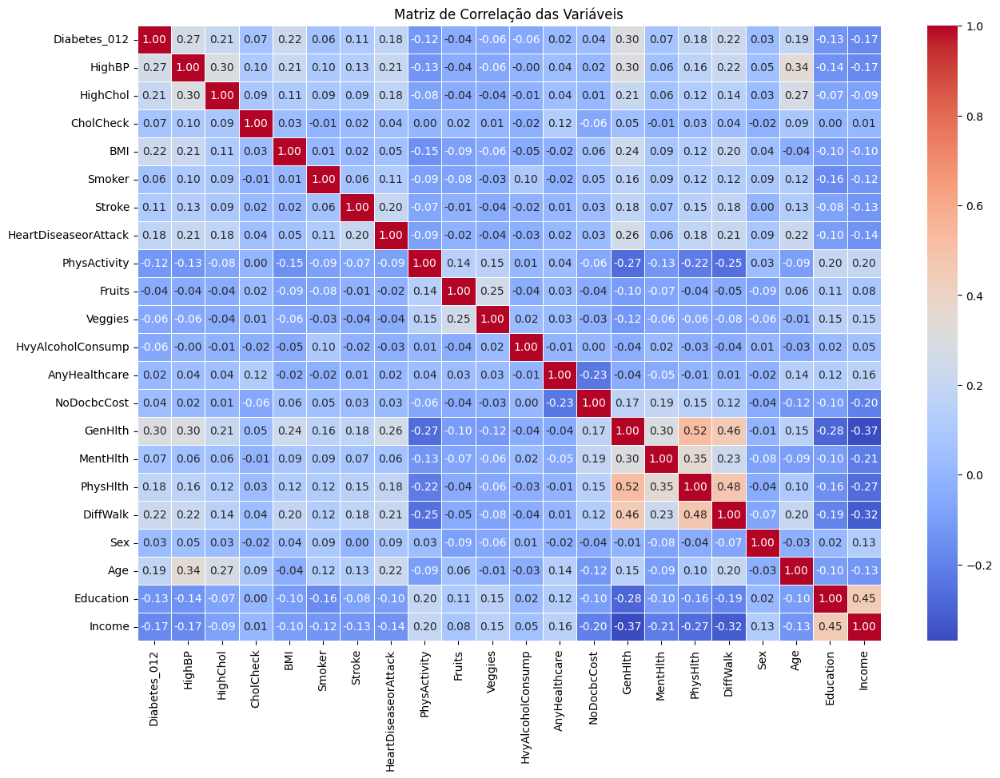

In [20]:
correlation_matrix = df_Diabetes.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlação das Variáveis')
plt.show()

A matriz de correlação foi utilizada para identificar relações entre todas as variáveis do dataset, revelando correlações positivas entre Alto Colesterol, Alta Pressão Sanguínea e risco de problema cardíaco, assim como entre Saúde Física, Dificuldade ao Andar e Saúde Geral. Correlações negativas significativas foram observadas entre Saúde Geral com Renda e Educação, e entre Renda e Educação com Diabetes.

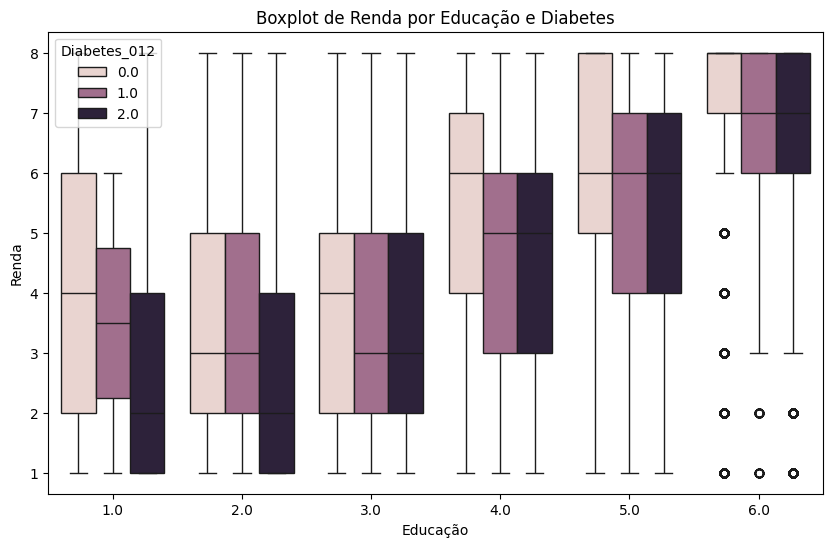

In [21]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_Diabetes, x='Education', y='Income', hue='Diabetes_012')
plt.title('Boxplot de Renda por Educação e Diabetes')
plt.xlabel('Educação')
plt.ylabel('Renda')
plt.show()


Esse boxplot mostra como as pessoas se dispersam ao longo do crescimento de renda e do maior nível de educação, é perceptível que nos casos em que a renda de um dos grupos é maior, esse grupo é sempre o de não diabéticos.

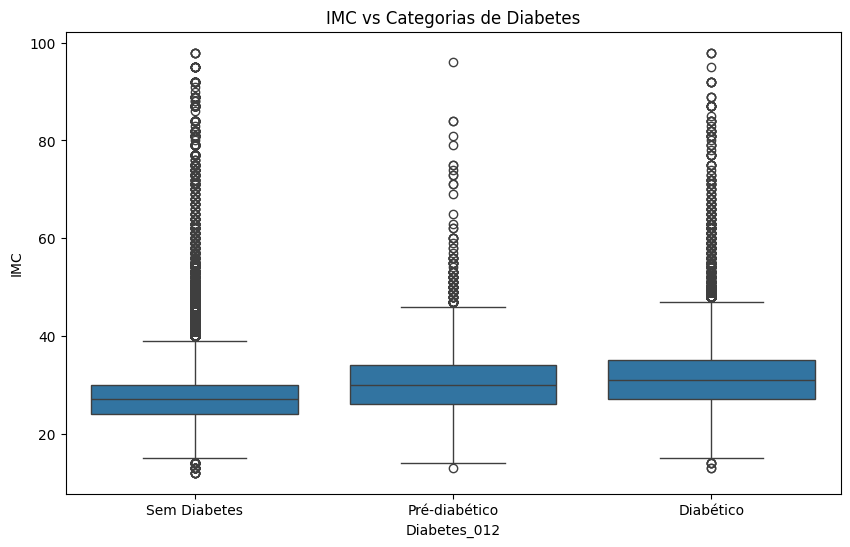

In [22]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df_Diabetes, x='Diabetes_012', y='BMI')
plt.title('IMC vs Categorias de Diabetes')
plt.xlabel('Diabetes_012')
plt.ylabel('IMC')
plt.xticks([0, 1, 2], ['Sem Diabetes', 'Pré-diabético', 'Diabético'])
plt.show()

Em seguida, utilizamos o boxplot para analisar a distribuição do IMC entre diferentes categorias de diabetes. O gráfico, mostrou que pacientes diabéticos e pré-diabéticos possuem um IMC consideravelmente maior do que pacientes não diabéticos. Este insight é consistente com a literatura que associa obesidade a um risco maior de diabetes.

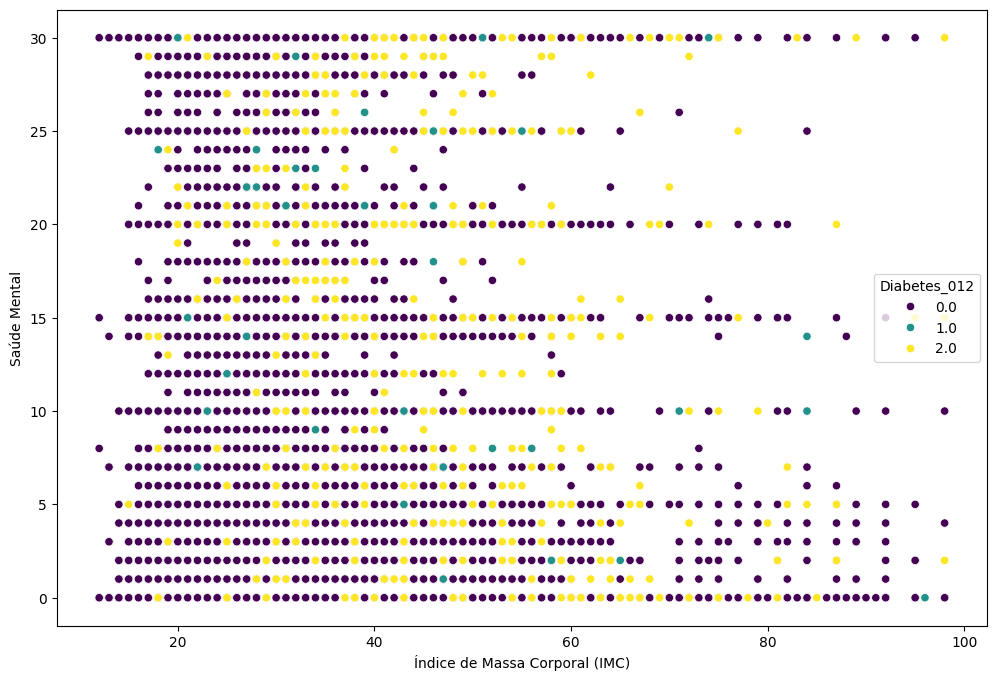

In [23]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='BMI', y='MentHlth', hue='Diabetes_012', data=df_Diabetes, palette='viridis')
plt.xlabel('Índice de Massa Corporal (IMC)')
plt.ylabel('Saúde Mental')
plt.show()


A partir deste gráfico de dispersão, podemos concluir que a saúde mental, medida em dias de saúde mental ruim nos últimos 30 dias, não parece variar drasticamente entre indivíduos não diabéticos, pré-diabéticos e diabéticos. A maioria dos indivíduos em todas as categorias de diabetes relatou poucos dias de problemas de saúde mental.

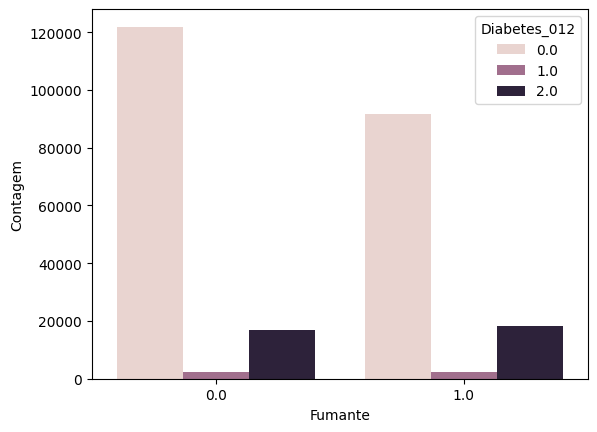

In [24]:
sns.countplot(x='Smoker', hue='Diabetes_012', data=df_Diabetes)
plt.xlabel('Fumante')
plt.ylabel('Contagem')
plt.show()

O gráfico de barras é utilizado para comparar proporções entre diferentes grupos. No gráfico de barras que compara fumantes e diabetes, observamos que existe uma quantidade menor de diabéticos fumantes comparado a não diabéticos fumantes. Para avaliar se a porcentagem de diabéticos fumantes é maior do que a de não diabéticos, podemos calcular as porcentagens e realizar um teste de proporções.

In [25]:
percent_diabetic_smokers = (df_Diabetes[(df_Diabetes['Diabetes_012'] == 2) & (df_Diabetes['Smoker'] == 1)].shape[0] / df_Diabetes[df_Diabetes['Diabetes_012'] == 2].shape[0]) * 100
percent_non_diabetic_smokers = (df_Diabetes[(df_Diabetes['Diabetes_012'] == 0) & (df_Diabetes['Smoker'] == 1)].shape[0] / df_Diabetes[df_Diabetes['Diabetes_012'] == 0].shape[0]) * 100

print('Porcentagem de diabéticos fumantes: ', percent_diabetic_smokers)
print('Porcentagem de não diabéticos fumantes: ', percent_non_diabetic_smokers)

Porcentagem de diabéticos fumantes:  51.82198834380129
Porcentagem de não diabéticos fumantes:  42.968044435501604


A partir dos cálculos de proporção, verificamos que 51.82% dos diabéticos são fumantes, enquanto 42.97% dos não diabéticos são fumantes.  Isso possivelmente indica que existe uma proporção maior de fumantes entre diabéticos do que os não diabéticos presentes no dataset.

# Feature engeneering

# Feature Acesso a Saúde(access_to_healthcare)

A nova feature **"access_to_healthcare"** foi criada para identificar se os indivíduos têm acesso adequado aos cuidados de saúde. Ela combina as informações das colunas **"AnyHealthcare"** e **"NoDocbcCost"** para fornecer uma visão mais clara sobre o acesso aos serviços de saúde.

### Colunas Utilizadas
**AnyHealthcare:** Indica se a pessoa tem algum tipo de cobertura de saúde (0 = Não, 1 = Sim).

**NoDocbcCost:** Indica se a pessoa não conseguiu ver um médico no último ano devido ao custo (0 = Não, 1 = Sim).

In [26]:
#Acesso a Saude
import pandas as pd

df_Diabetes = pd.read_csv('../DiabetesDataSet/diabetes_012_health_indicators_BRFSS2015.csv', low_memory=False)

#Transforma as colunas em valores booleanos
df_Diabetes['AnyHealthcare'] = df_Diabetes['AnyHealthcare'].astype(bool)
df_Diabetes['NoDocbcCost'] = df_Diabetes['NoDocbcCost'].astype(bool)

#Cria a nova coluna 'access_to_healthcare'
df_Diabetes['access_to_healthcare'] = df_Diabetes['AnyHealthcare'] & ~df_Diabetes['NoDocbcCost']

#Apresenta as colunas envolvidas na feature
print(df_Diabetes[['AnyHealthcare', 'NoDocbcCost', 'access_to_healthcare']].head(-5))

        AnyHealthcare  NoDocbcCost  access_to_healthcare
0                True        False                  True
1               False         True                 False
2                True         True                 False
3                True        False                  True
4                True        False                  True
...               ...          ...                   ...
253670           True        False                  True
253671           True         True                 False
253672           True        False                  True
253673           True        False                  True
253674           True        False                  True

[253675 rows x 3 columns]


# Feature Risco cardiovascular("cardio_risk")

A feature **"cardio_risk"** foi criada para calcular um índice de risco cardiovascular com base nas condições de saúde presentes nos dados. Ela combina as informações das colunas **"HighBP"**, **"HighChol"**, **"Stroke"** e **"HeartDiseaseorAttack"** (doença cardíaca coronariana ou infarto do miocárdio). 

### Colunas Utilizadas
**HighBP:** Indica se a pessoa tem pressão alta (0 = Não, 1 = Sim).

**HighChol:** Indica se a pessoa tem colesterol alto (0 = Não, 1 = Sim).

**Stroke:** Indica se a pessoa já teve um derrame (0 = Não, 1 = Sim).

**HeartDiseaseorAttack:** Indica se a pessoa teve doença cardíaca coronariana (CHD) ou infarto do miocárdio (MI) (0 = Não, 1 = Sim).

### Valores da Feature
**0:** Indica que o indivíduo não apresenta nenhuma das condições de risco cardiovascular.

**1:** Indica que o indivíduo apresenta uma condição de risco cardiovascular.

**2:** Indica que o indivíduo apresenta duas condições de risco cardiovascular.

**3:** Indica que o indivíduo apresenta três condições de risco cardiovascular.

**4:** Indica que o indivíduo apresenta as quatro condições de risco cardiovascular.

In [27]:
import pandas as pd

df_Diabetes = pd.read_csv('../DiabetesDataSet/diabetes_012_health_indicators_BRFSS2015.csv', low_memory=False)

#Transforma as colunas em valores booleanos
df_Diabetes['HighBP'] = df_Diabetes['HighBP'].astype(bool)
df_Diabetes['HighChol'] = df_Diabetes['HighChol'].astype(bool)
df_Diabetes['Stroke'] = df_Diabetes['Stroke'].astype(bool)
df_Diabetes['HeartDiseaseorAttack'] = df_Diabetes['HeartDiseaseorAttack'].astype(bool)

#Cria a nova coluna 'cardio_risk'
df_Diabetes['cardio_risk'] = df_Diabetes[['HighBP', 'HighChol', 'Stroke', 'HeartDiseaseorAttack']].sum(axis=1)

#Apresenta as colunas envolvidas na feature
print(df_Diabetes[['HighBP', 'HighChol', 'Stroke', 'HeartDiseaseorAttack', 'cardio_risk']].head(-5))

        HighBP  HighChol  Stroke  HeartDiseaseorAttack  cardio_risk
0         True      True   False                 False            2
1        False     False   False                 False            0
2         True      True   False                 False            2
3         True     False   False                 False            1
4         True      True   False                 False            2
...        ...       ...     ...                   ...          ...
253670    True      True   False                  True            3
253671    True      True    True                  True            4
253672    True     False   False                  True            2
253673    True     False   False                 False            1
253674   False     False   False                 False            0

[253675 rows x 5 columns]
